## Project:Forecasting energy demands 

## Importing necessary libraries

In [1]:
import numpy as np 

# data in/out & eda
import pandas as pd 
import warnings

# visualisations
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from statsmodels.tsa.stattools import adfuller

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

import itertools
from statsmodels.tsa.arima.model import ARIMA
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.metrics import mean_absolute_error, mean_squared_error
from math import sqrt


## Loading the data

In [2]:
df=pd.read_csv('../data/PJME_hourly.csv')



## Display first five rows

In [3]:
df.head()

,Datetime,PJME_MW
0,2002-12-31 01:00:00,26498.0
1,2002-12-31 02:00:00,25147.0
2,2002-12-31 03:00:00,24574.0
3,2002-12-31 04:00:00,24393.0
4,2002-12-31 05:00:00,24860.0


## display last five rows

In [4]:
df.tail()

,Datetime,PJME_MW
145361,2018-01-01 20:00:00,44284.0
145362,2018-01-01 21:00:00,43751.0
145363,2018-01-01 22:00:00,42402.0
145364,2018-01-01 23:00:00,40164.0
145365,2018-01-02 00:00:00,38608.0


## Sorting the data

In [5]:
# sort by date & time
df['Datetime'] = pd.to_datetime(df['Datetime'])
df.sort_values(by=['Datetime'], axis=0, ascending=True, inplace=True)
df.reset_index(inplace=True, drop=True)



# display the first couple of rows
df.head()

,Datetime,PJME_MW
0,2002-01-01 01:00:00,30393.0
1,2002-01-01 02:00:00,29265.0
2,2002-01-01 03:00:00,28357.0
3,2002-01-01 04:00:00,27899.0
4,2002-01-01 05:00:00,28057.0


## Shape of the data

In [6]:
df.shape

(145366, 2)

## Columns of the data

In [7]:
df.columns


Index(['Datetime', 'PJME_MW'], dtype='object')

## EDA

## Info of the data

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145366 entries, 0 to 145365
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   Datetime  145366 non-null  datetime64[ns]
 1   PJME_MW   145366 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 2.2 MB


## Statistical information

In [9]:
df.describe()

,Datetime,PJME_MW
count,145366,145366.000000
mean,2010-04-18 03:25:25.999201536,32080.222831
min,2002-01-01 01:00:00,14544.000000
25%,2006-02-23 14:15:00,27573.000000
50%,2010-04-18 04:30:00,31421.000000
75%,2014-06-10 18:45:00,35650.000000
max,2018-08-03 00:00:00,62009.000000
std,NaN,6464.012166


# Data cleaning

## Checking duplicates

In [10]:
df.duplicated().sum()

0

In [11]:
##there are no duplicates in the dataset 

## Checking nulls

In [12]:
df.isnull().sum()

Datetime    0
PJME_MW     0
dtype: int64

In [13]:
##there are no nulls in the dataset

## Checking outliers

In [14]:


# Example column name: 'demand_in_MW'
col = 'PJME_MW'

# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = df[col].quantile(0.25)
Q3 = df[col].quantile(0.75)

# Calculate IQR
IQR = Q3 - Q1

# Define bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]

# Count of outliers
print(f"Number of outliers in '{col}':", outliers.shape[0])

# Optionally, display the outlier rows
# print(outliers)


Number of outliers in 'PJME_MW': 3455


In [15]:
##there aresome of the outliers in the dataset

## Handling the outliers

In [16]:


# Count outliers before capping
outliers_before = ((df[col] < lower_bound) | (df[col] > upper_bound)).sum()
print(f"Number of outliers before capping: {outliers_before}")

# Apply capping
df[col] = df[col].apply(lambda x: lower_bound if x < lower_bound else upper_bound if x > upper_bound else x)

# Count outliers after capping
outliers_after = ((df[col] < lower_bound) | (df[col] > upper_bound)).sum()
print(f"Number of outliers after capping: {outliers_after}")


Number of outliers before capping: 3455
Number of outliers after capping: 0


In [17]:
##the outliers are capped using IQR method,now there are no outliers

## Extracting the features

## Setting the datetime as index

In [18]:
# Step 2: Set it as index
df.set_index('Datetime', inplace=True)
df.head()

,PJME_MW
Datetime,
2002-01-01 01:00:00,30393.0
2002-01-01 02:00:00,29265.0
2002-01-01 03:00:00,28357.0
2002-01-01 04:00:00,27899.0
2002-01-01 05:00:00,28057.0


In [19]:
# Add datetime features
df['dow'] = df.index.dayofweek            # Day of week (0=Monday)
df['doy'] = df.index.dayofyear            # Day of year
df['year'] = df.index.year
df['month'] = df.index.month
df['quarter'] = df.index.quarter
df['hour'] = df.index.hour
df['dom'] = df.index.day                  # Day of month
df['date'] = df.index.date

# Map months to seasons by name
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

df['season'] = df['month'].apply(get_season)
df.head()

,PJME_MW,dow,doy,year,month,quarter,hour,dom,date,season
Datetime,,,,,,,,,,
2002-01-01 01:00:00,30393.0,1,1,2002,1,1,1,1,2002-01-01,Winter
2002-01-01 02:00:00,29265.0,1,1,2002,1,1,2,1,2002-01-01,Winter
2002-01-01 03:00:00,28357.0,1,1,2002,1,1,3,1,2002-01-01,Winter
2002-01-01 04:00:00,27899.0,1,1,2002,1,1,4,1,2002-01-01,Winter
2002-01-01 05:00:00,28057.0,1,1,2002,1,1,5,1,2002-01-01,Winter


## Visuals

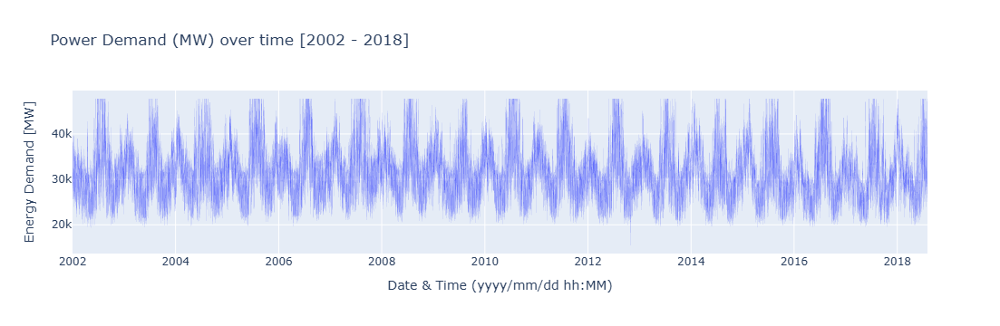

In [20]:

# Reset index if 'Datetime' is in the index
df_reset = df.reset_index()

# Plotting
fig = px.line(df_reset,
              x='Datetime',
              y='PJME_MW',
              title=f'Power Demand (MW) over time [{df_reset.year.min()} - {df_reset.year.max()}]')
fig.update_traces(line=dict(width=0.05))
fig.update_layout(xaxis_title='Date & Time (yyyy/mm/dd hh:MM)',
                  yaxis_title='Energy Demand [MW]')
fig.show()


In [21]:
##to apply time series models we have to check the stationarity of the data

## checking stationarity

In [22]:


# Function to check stationarity using ADF test
def check_stationarity(series):
    result = adfuller(series.dropna())  # Always drop NaNs
    return result[1]  # p-value

# Extract only numerical columns
numerical_columns = df.select_dtypes(include='number').columns

# Check stationarity for each numerical column
stationarity_results = {}
for col in numerical_columns:
    p_value = check_stationarity(df[col])
    stationarity_results[col] = p_value
    print(f"ADF p-value for {col}: {p_value}")

# Displaying the results
print("\n📊 Stationarity results:")
for col, p_value in stationarity_results.items():
    if p_value < 0.05:
        print(f"✅ {col}: Stationary (p-value: {p_value:.4f})")
    else:
        print(f"❌ {col}: Non-stationary (p-value: {p_value:.4f})")


ADF p-value for PJME_MW: 0.0
ADF p-value for dow: 0.0
ADF p-value for doy: 5.842824361107465e-10
ADF p-value for year: 0.9321304987026463
ADF p-value for month: 2.5209538114410097e-09
ADF p-value for quarter: 3.217916550458351e-08
ADF p-value for hour: 0.0
ADF p-value for dom: 0.0

📊 Stationarity results:
✅ PJME_MW: Stationary (p-value: 0.0000)
✅ dow: Stationary (p-value: 0.0000)
✅ doy: Stationary (p-value: 0.0000)
❌ year: Non-stationary (p-value: 0.9321)
✅ month: Stationary (p-value: 0.0000)
✅ quarter: Stationary (p-value: 0.0000)
✅ hour: Stationary (p-value: 0.0000)
✅ dom: Stationary (p-value: 0.0000)


In [23]:
##since the column year is non-stationary,we will apply differencing on the column

## Differencing the year column

In [24]:
df['year_diff'] = df['year'].diff()


In [25]:
print("Year diff p-value:", adfuller(df['year_diff'].dropna())[1])

Year diff p-value: 0.0


In [26]:
## as p value is less than 0.05,the yearcolumn is now stationary

## Data splitting

In [27]:

# Split the data into training and testing sets
train_size = int(len(df) * 0.8)  # 80% training, 20% testing
train, test = df[:train_size], df[train_size:]
print(f"Training set length: {len(train)}")
print(f"Testing set length: {len(test)}")
# Save the training and testing data (optional)
train.to_csv('../data/train_data.csv')
test.to_csv('../data/test_data.csv')

Training set length: 116292
Testing set length: 29074


In [28]:
##the data is splitted and saved into tain_data and test_data csv files into data folder

In [58]:
df.to_csv('cleaneddata.csv', index=False)
